   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 36.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.0/94.0 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 84.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 100.7 MB/s eta 0:00:00


Saving food detect.v15-yellow-rice-added.yolov8.zip to food detect.v15-yellow-rice-added.yolov8.zip
Dataset ready at: food detect.v15-yellow-rice-added.yolov8
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.15 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=food detect.v15-yellow-rice-added.yolov8/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=N

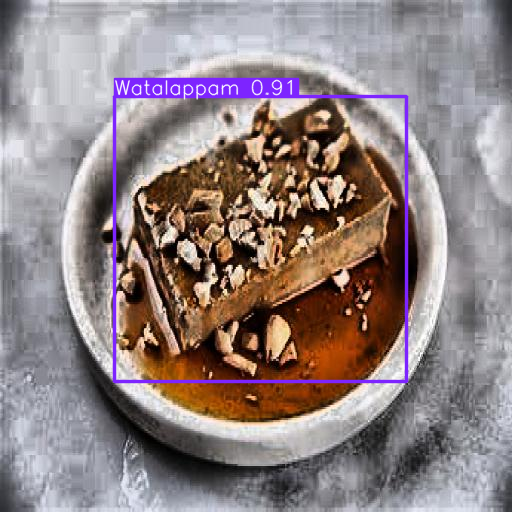

In [1]:
# Step 0: Install packages
!pip install ultralytics roboflow --quiet

# Step 1: Upload your dataset ZIP
from google.colab import files
uploaded = files.upload()  # choose your ZIP file

# Step 2: Unzip the dataset
import zipfile
import os
for fn in uploaded.keys():
    with zipfile.ZipFile(fn, 'r') as zip_ref:
        zip_ref.extractall(fn.replace(".zip",""))

dataset_path = fn.replace(".zip","")
print("Dataset ready at:", dataset_path)

# Step 3: Train a small YOLOv8 model quickly
from ultralytics import YOLO

# Use yolov8n.pt (nano) for very fast training
model = YOLO("yolov8s.pt")

# Quick training settings for testing
model.train(
    data=f"{dataset_path}/data.yaml",  # path to data.yaml
    epochs=40,                          # small number of epochs for fast start
    imgsz=640,                         # smaller images to speed up
    batch=4,                            # smaller batch for Colab free
    project="meal_plate_test",          # save results here
    name="quick_train",
    exist_ok=True,
    device=0
)

# Step 4: Test on one example image
example_image = os.path.join(dataset_path, "valid/images", os.listdir(os.path.join(dataset_path, "valid/images"))[0])
results = model.predict(example_image)
results[0].show()  # show the first (and only) result



Testing on: cab25_jpg.rf.f9269d8461ae05b71ec7ec983e67df45.jpg

image 1/1 /content/food detect.v15-yellow-rice-added.yolov8/valid/images/cab25_jpg.rf.f9269d8461ae05b71ec7ec983e67df45.jpg: 640x640 1 Cabbage Curry, 16.3ms
Speed: 2.6ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


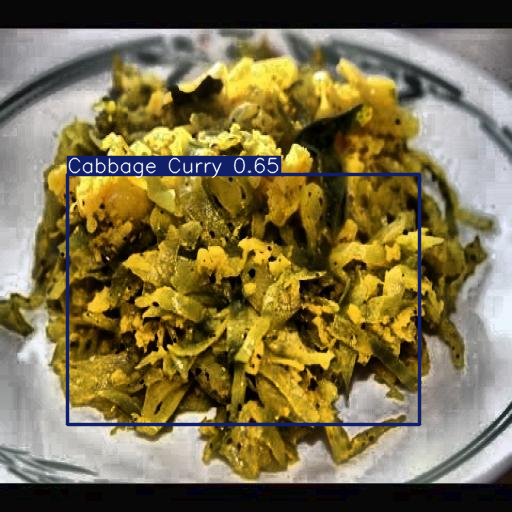

In [2]:
import random
import os

# Pick a random image from your validation set
valid_images_dir = os.path.join(dataset_path, "valid/images")
random_image = random.choice(os.listdir(valid_images_dir))
example_image = os.path.join(valid_images_dir, random_image)

print("Testing on:", random_image)
results = model.predict(example_image)
results[0].show()


Upload new meal plate images (you can select multiple):


Saving dca0187014484df362035bda44341456.jpg to dca0187014484df362035bda44341456.jpg
Saving egg test2.PNG to egg test2.PNG
Saving fied ric etest2.PNG to fied ric etest2.PNG
Saving mango tets.PNG to mango tets.PNG
Saving okra test2.PNG to okra test2.PNG
Saving papdam test.PNG to papdam test.PNG
Saving polos test2.jpg to polos test2.jpg
Saving PSV1029_0.jpg to PSV1029_0.jpg
Saving roti tets.jpg to roti tets.jpg
Saving Sausage-Bun-1.jpg to Sausage-Bun-1.jpg
Saving soya test.PNG to soya test.PNG
Saving spra test.jpeg to spra test.jpeg
Saving test.jpg to test.jpg
Saving test2.jpg to test2.jpg
Saving test5.jpg to test5.jpg
15 image(s) uploaded for testing.

--- Testing: new_food_images/dca0187014484df362035bda44341456.jpg ---

image 1/1 /content/new_food_images/dca0187014484df362035bda44341456.jpg: 640x480 1 Dhal Curry, 1 Gotukola Mallum, 1 Papadam, 1 rice, 46.0ms
Speed: 2.3ms preprocess, 46.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /content/new_food_imag

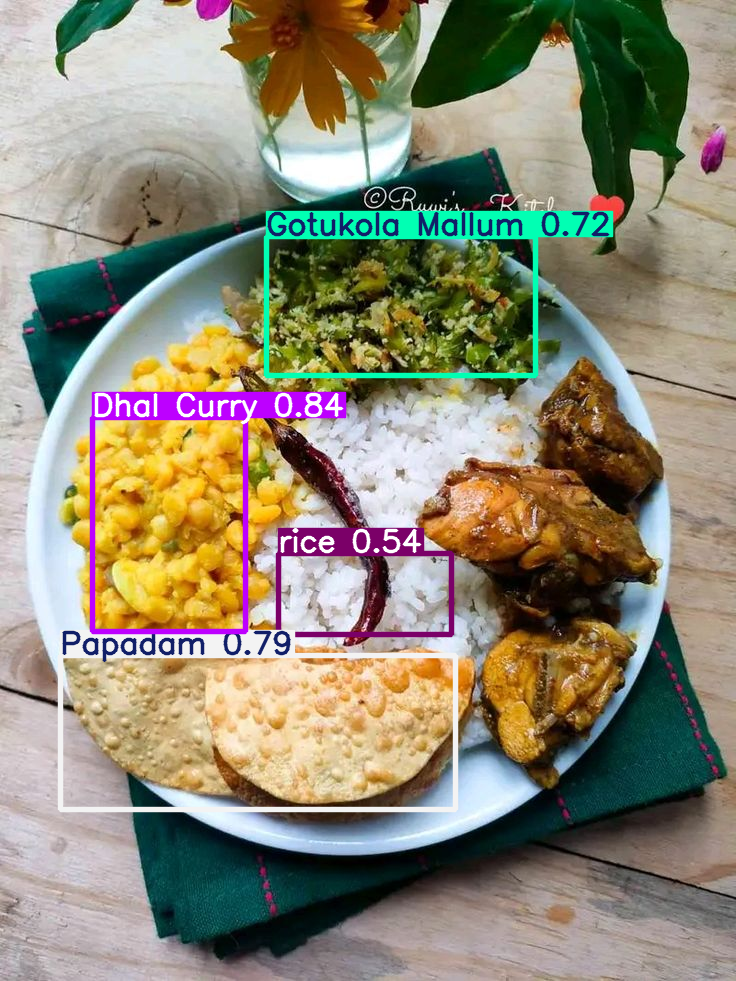

Detected foods:
  - Dhal Curry, Confidence: 0.84
  - Papadam, Confidence: 0.79
  - Gotukola Mallum, Confidence: 0.72
  - rice, Confidence: 0.54

--- Testing: new_food_images/egg test2.PNG ---

image 1/1 /content/new_food_images/egg test2.PNG: 480x640 (no detections), 65.2ms
Speed: 3.1ms preprocess, 65.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/new_food_images/egg test2.PNG: 480x640 (no detections), 12.8ms
Speed: 2.8ms preprocess, 12.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


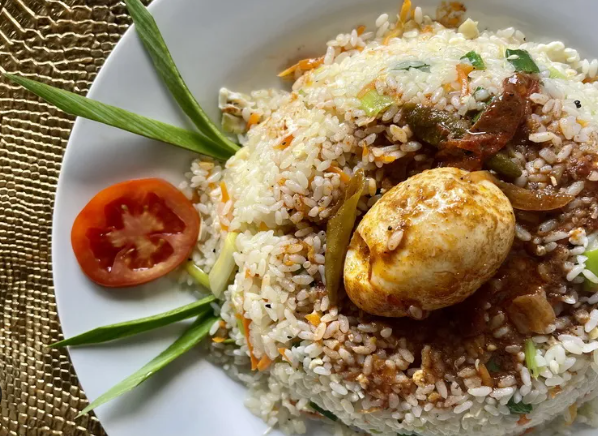

Detected foods:

--- Testing: new_food_images/fied ric etest2.PNG ---

image 1/1 /content/new_food_images/fied ric etest2.PNG: 448x640 1 Fried rice, 85.0ms
Speed: 4.3ms preprocess, 85.0ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/new_food_images/fied ric etest2.PNG: 448x640 1 Fried rice, 12.7ms
Speed: 2.8ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


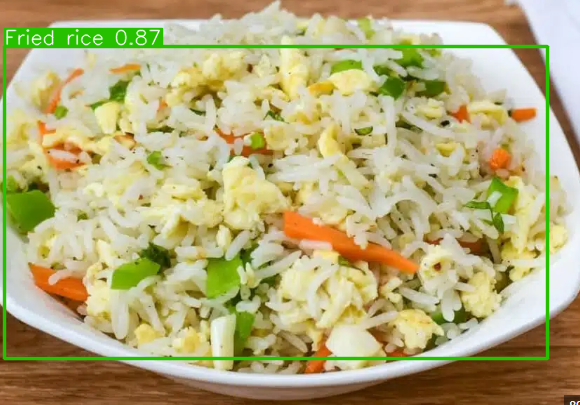

Detected foods:
  - Fried rice, Confidence: 0.87

--- Testing: new_food_images/mango tets.PNG ---

image 1/1 /content/new_food_images/mango tets.PNG: 640x544 (no detections), 66.8ms
Speed: 2.6ms preprocess, 66.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 /content/new_food_images/mango tets.PNG: 640x544 (no detections), 15.8ms
Speed: 3.8ms preprocess, 15.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 544)


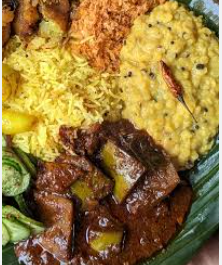

Detected foods:

--- Testing: new_food_images/okra test2.PNG ---

image 1/1 /content/new_food_images/okra test2.PNG: 544x640 1 Beans curry, 69.2ms
Speed: 3.9ms preprocess, 69.2ms inference, 1.9ms postprocess per image at shape (1, 3, 544, 640)

image 1/1 /content/new_food_images/okra test2.PNG: 544x640 1 Beans curry, 15.8ms
Speed: 3.2ms preprocess, 15.8ms inference, 2.1ms postprocess per image at shape (1, 3, 544, 640)


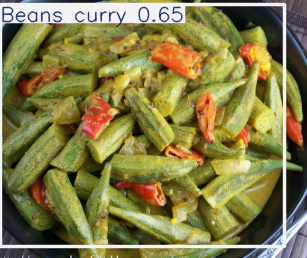

Detected foods:
  - Beans curry, Confidence: 0.65

--- Testing: new_food_images/papdam test.PNG ---

image 1/1 /content/new_food_images/papdam test.PNG: 608x640 1 Dhal Curry, 1 Papadam, 1 Pol Sambol, 69.5ms
Speed: 5.2ms preprocess, 69.5ms inference, 1.6ms postprocess per image at shape (1, 3, 608, 640)

image 1/1 /content/new_food_images/papdam test.PNG: 608x640 1 Dhal Curry, 1 Papadam, 1 Pol Sambol, 15.9ms
Speed: 3.0ms preprocess, 15.9ms inference, 1.6ms postprocess per image at shape (1, 3, 608, 640)


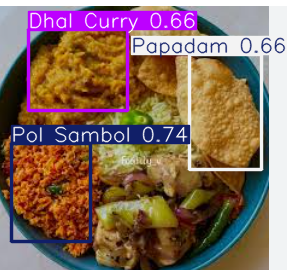

Detected foods:
  - Pol Sambol, Confidence: 0.74
  - Papadam, Confidence: 0.66
  - Dhal Curry, Confidence: 0.66

--- Testing: new_food_images/polos test2.jpg ---

image 1/1 /content/new_food_images/polos test2.jpg: 384x640 1 Gotukola Mallum, 3 rices, 69.1ms
Speed: 2.8ms preprocess, 69.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/new_food_images/polos test2.jpg: 384x640 1 Gotukola Mallum, 3 rices, 12.3ms
Speed: 3.1ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


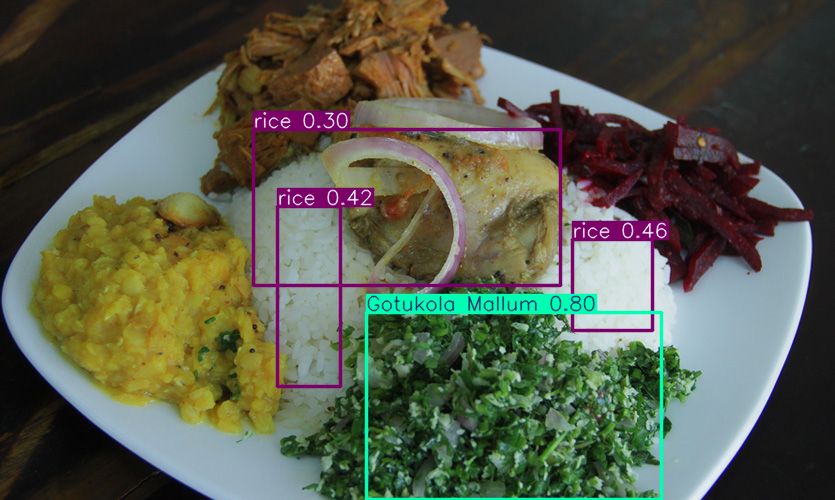

Detected foods:
  - Gotukola Mallum, Confidence: 0.80
  - rice, Confidence: 0.46
  - rice, Confidence: 0.42
  - rice, Confidence: 0.30

--- Testing: new_food_images/PSV1029_0.jpg ---

image 1/1 /content/new_food_images/PSV1029_0.jpg: 448x640 1 Sausage Hotdog, 13.9ms
Speed: 2.6ms preprocess, 13.9ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/new_food_images/PSV1029_0.jpg: 448x640 1 Sausage Hotdog, 12.7ms
Speed: 3.0ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


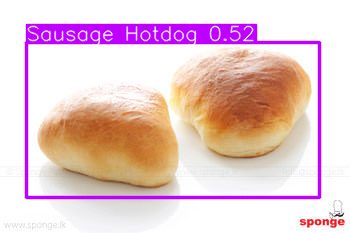

Detected foods:
  - Sausage Hotdog, Confidence: 0.52

--- Testing: new_food_images/roti tets.jpg ---

image 1/1 /content/new_food_images/roti tets.jpg: 640x512 1 Sweets, 67.9ms
Speed: 2.8ms preprocess, 67.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 /content/new_food_images/roti tets.jpg: 640x512 1 Sweets, 12.1ms
Speed: 3.7ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 512)


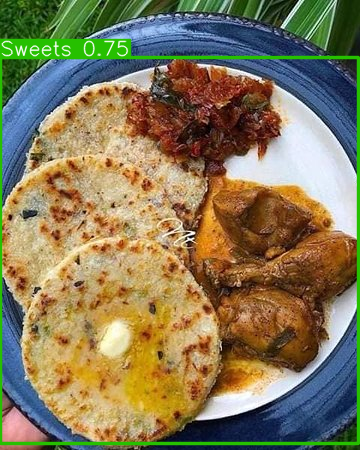

Detected foods:
  - Sweets, Confidence: 0.75

--- Testing: new_food_images/Sausage-Bun-1.jpg ---

image 1/1 /content/new_food_images/Sausage-Bun-1.jpg: 384x640 1 Sausage Hotdog, 13.8ms
Speed: 4.4ms preprocess, 13.8ms inference, 3.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/new_food_images/Sausage-Bun-1.jpg: 384x640 1 Sausage Hotdog, 16.8ms
Speed: 5.2ms preprocess, 16.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


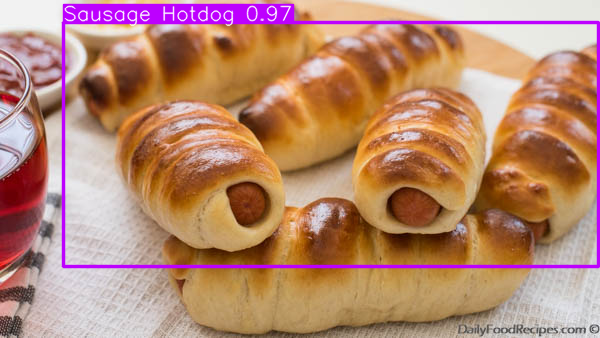

Detected foods:
  - Sausage Hotdog, Confidence: 0.97

--- Testing: new_food_images/soya test.PNG ---

image 1/1 /content/new_food_images/soya test.PNG: 640x640 3 Egg currys, 17.2ms
Speed: 7.4ms preprocess, 17.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/new_food_images/soya test.PNG: 640x640 3 Egg currys, 16.2ms
Speed: 3.1ms preprocess, 16.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


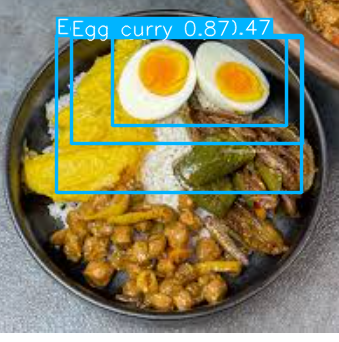

Detected foods:
  - Egg curry, Confidence: 0.87
  - Egg curry, Confidence: 0.47
  - Egg curry, Confidence: 0.31

--- Testing: new_food_images/spra test.jpeg ---

image 1/1 /content/new_food_images/spra test.jpeg: 448x640 1 Sprats, 13.7ms
Speed: 2.7ms preprocess, 13.7ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/new_food_images/spra test.jpeg: 448x640 1 Sprats, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


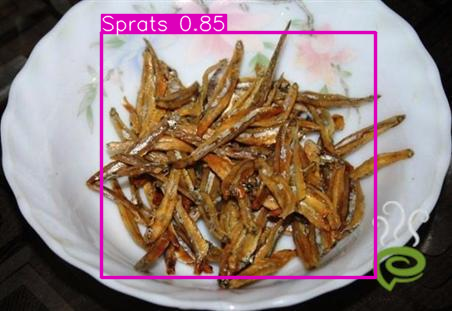

Detected foods:
  - Sprats, Confidence: 0.85

--- Testing: new_food_images/test.jpg ---

image 1/1 /content/new_food_images/test.jpg: 640x480 1 Beans curry, 1 yellow rice, 13.2ms
Speed: 4.3ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /content/new_food_images/test.jpg: 640x480 1 Beans curry, 1 yellow rice, 12.1ms
Speed: 4.0ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


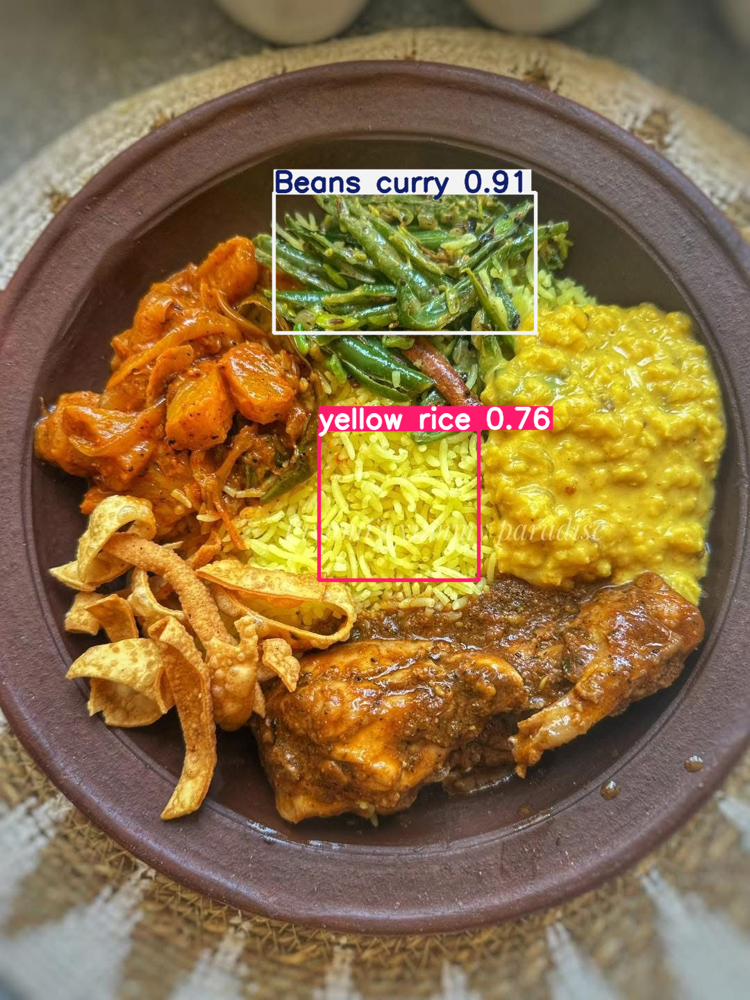

Detected foods:
  - Beans curry, Confidence: 0.91
  - yellow rice, Confidence: 0.76

--- Testing: new_food_images/test2.jpg ---

image 1/1 /content/new_food_images/test2.jpg: 640x480 1 Egg curry, 1 Fish Curry, 2 Fried Filleds, 1 Papadam, 1 Soya curry, 1 Sprats, 12.3ms
Speed: 3.6ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /content/new_food_images/test2.jpg: 640x480 1 Egg curry, 1 Fish Curry, 2 Fried Filleds, 1 Papadam, 1 Soya curry, 1 Sprats, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


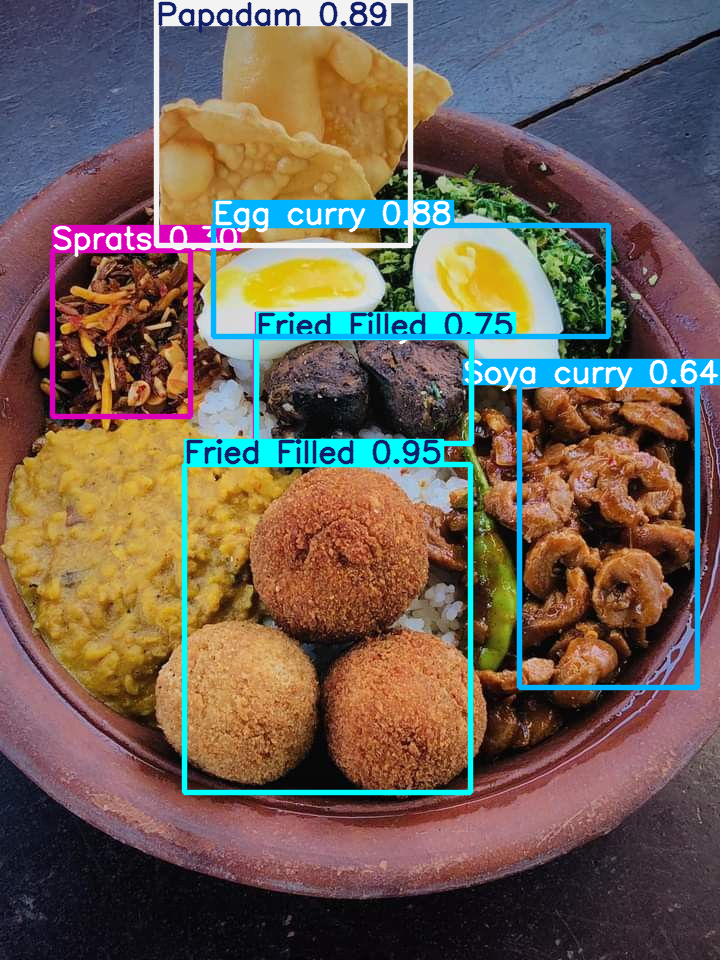

Detected foods:
  - Fried Filled, Confidence: 0.95
  - Papadam, Confidence: 0.89
  - Egg curry, Confidence: 0.88
  - Fried Filled, Confidence: 0.75
  - Fish Curry, Confidence: 0.74
  - Soya curry, Confidence: 0.64
  - Sprats, Confidence: 0.30

--- Testing: new_food_images/test5.jpg ---

image 1/1 /content/new_food_images/test5.jpg: 640x480 1 Carrot, 1 Dhal Curry, 2 rices, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /content/new_food_images/test5.jpg: 640x480 1 Carrot, 1 Dhal Curry, 2 rices, 13.4ms
Speed: 5.4ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


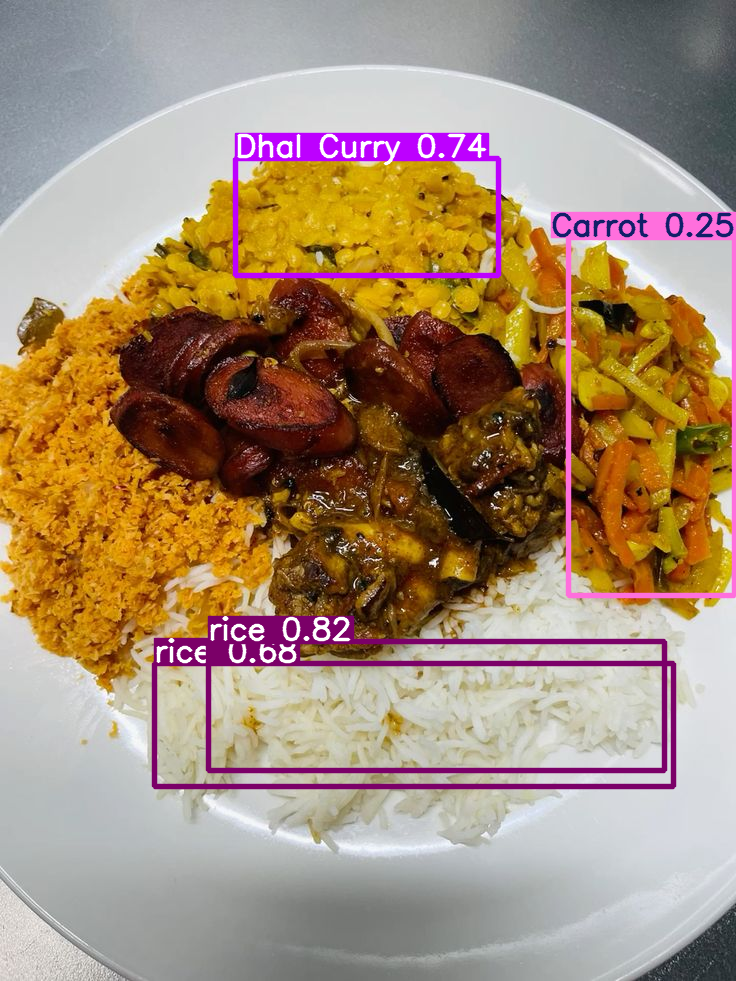

Detected foods:
  - rice, Confidence: 0.82
  - Dhal Curry, Confidence: 0.74
  - rice, Confidence: 0.68
  - Carrot, Confidence: 0.25


In [3]:
# ==========================
# Cell 3: Test on new/unseen images
# ==========================

from ultralytics import YOLO
from google.colab import files
import os

# 1️⃣ Load your trained YOLOv8 model
model = YOLO("/content/runs/detect/meal_plate_test/quick_train/weights/best.pt")

# 2️⃣ Upload one or more new images (simulate user uploads)
print("Upload new meal plate images (you can select multiple):")
uploaded = files.upload()  # user selects image files

# 3️⃣ Create a folder to save uploaded images
os.makedirs("new_food_images", exist_ok=True)

# Save uploaded images
uploaded_files = []
for filename in uploaded.keys():
    path = os.path.join("new_food_images", filename)
    uploaded_files.append(path)
    with open(path, "wb") as f:
        f.write(uploaded[filename])
print(f"{len(uploaded_files)} image(s) uploaded for testing.")

# 4️⃣ Run predictions on each uploaded image
for img_path in uploaded_files:
    print("\n--- Testing:", img_path, "---")
    results = model.predict(img_path)  # Run YOLO detection

    # Show the image with bounding boxes
    results = model.predict(img_path)  # Run YOLO detection

    # Show the image with bounding boxes
    results[0].show()

    # Print detected foods with confidence scores
    print("Detected foods:")
    for box in results[0].boxes:
        class_id = int(box.cls[0])
        confidence = float(box.conf[0])
        class_name = model.names[class_id]
        print(f"  - {class_name}, Confidence: {confidence:.2f}")
